## **Classez des images**

### partie 1/4 : analyse et prétraitement des images

<br>

> #### notebook contenant l'analyse et le prétraitement d'images (e.g. whitening, equalization, modification de la taille des images). <br><br>

<br>


## 0 Imports


### 0.1 Librairies, réglages


In [572]:
# paths, folders/files
import os, sys, random
from glob import glob
import re
# from zipfile import ZipFile

# math, dataframes
import numpy as np
import pandas as pd
from pandarallel import pandarallel
# from collections import Counter

# Visualisation
from pprint import pprint
import matplotlib.pyplot as plt
from matplotlib.image import imread
# import seaborn as sns
import plotly.express as px
# from wordcloud import WordCloud
from PIL import Image, ImageOps #, ImageEnhance

# Feature engineering
from sklearn import preprocessing
try:
    import cv2
except:
    print('Installing opencv...')
    !pip install opencv-python # activate env first


print('\nPython version ' + sys.version)
print('pandas version ' + pd.__version__)

# plt.style.use('ggplot')
pd.set_option('display.max_rows', 200)

# Modify if necessary
num_cores = os.cpu_count()
print(f"\nNumber of CPU cores: {num_cores}")
pandarallel.initialize(progress_bar=False, nb_workers=6)



Python version 3.11.5 (main, Sep 11 2023, 13:23:44) [GCC 11.2.0]
pandas version 2.2.1

Number of CPU cores: 8
INFO: Pandarallel will run on 6 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


### 0.2 Fonctions


In [573]:
#


### 0.3 Variables globales


In [574]:
nb_classes = 3      # min 2, max 120

size_wh = 128
target_size=(size_wh, size_wh) # pour grille 5x5, stride (2,2) ?

original_path = './data/raw_data/Images'
path_formatted = './data/cleaned_data/0_format'


## 1 Data, analyse


### 1.1 Observons nos données


In [575]:
# Nous avons besoin d'un dataframe contenant :

# - 1 feature : les photos (ou leurs adresses) pour les classes qui nous intéressent
#               (3 classes pour commencer)
# - la target (= la race du chien pour chaque photo)


# verify path

def check_folders(path=original_path):
    """List content of the Image folder"""
    data_path = glob(path+'*/*')
    list_folders = [folder for folder in data_path]
    print(len(list_folders))
    print(len(set(list_folders)), '\n') # pas de doublons
    pprint(list_folders)


check_folders()


120
120 

['./data/raw_data/Images/n02108551-Tibetan_mastiff',
 './data/raw_data/Images/n02088466-bloodhound',
 './data/raw_data/Images/n02088094-Afghan_hound',
 './data/raw_data/Images/n02094114-Norfolk_terrier',
 './data/raw_data/Images/n02105505-komondor',
 './data/raw_data/Images/n02098286-West_Highland_white_terrier',
 './data/raw_data/Images/n02095889-Sealyham_terrier',
 './data/raw_data/Images/n02108000-EntleBucher',
 './data/raw_data/Images/n02113624-toy_poodle',
 './data/raw_data/Images/n02099429-curly-coated_retriever',
 './data/raw_data/Images/n02089973-English_foxhound',
 './data/raw_data/Images/n02099712-Labrador_retriever',
 './data/raw_data/Images/n02099601-golden_retriever',
 './data/raw_data/Images/n02110063-malamute',
 './data/raw_data/Images/n02108089-boxer',
 './data/raw_data/Images/n02100583-vizsla',
 './data/raw_data/Images/n02111500-Great_Pyrenees',
 './data/raw_data/Images/n02110958-pug',
 './data/raw_data/Images/n02100236-German_short-haired_pointer',
 './data/

### 1.2 Représentation des classes


In [576]:
# We want to select 3 classes (breeds)
# Conseil mentor : choisir les 3 classes les mieux représentées
# (=contenant le + de photos) pour mieux entrainer les modèles ensuite.

# Observons combien de photos nous avons pour chaque dossier (race de chien)

def check_nb_pics(path=original_path):
    """Count number of available pictures for each breed"""
    data_path = glob(path+'*/*')
    list_folders = [folder for folder in data_path]
    dict_nb_pics_per_breed = {}
    for folder in list_folders:
        path_pictures = glob(folder + '*/*.jp*')
        nb_pics = len([file for file in path_pictures])
        dict_nb_pics_per_breed[folder] = nb_pics

    return dict_nb_pics_per_breed

dict_nb_pics = check_nb_pics()


In [577]:
# sort the dict in descending order
dict_nb_pics = dict(sorted(dict_nb_pics.items(), key=lambda item: item[1], reverse=True))


In [578]:
# Visualisons
df_nb_pics = pd.DataFrame(list(dict_nb_pics.items()), columns=['original_address', 'nb_pics'])

# Sort the DataFrame in descending order
df_nb_pics = df_nb_pics.sort_values(by='nb_pics', ascending=False)

display(df_nb_pics.head())

print(df_nb_pics.shape)
df_nb_pics.describe()

# Le describe(), c'est déjà une visualisation :)


,original_address,nb_pics
0,./data/raw_data/Images/n02085936-Maltese_dog,252
1,./data/raw_data/Images/n02088094-Afghan_hound,239
2,./data/raw_data/Images/n02092002-Scottish_deer...,232
3,./data/raw_data/Images/n02112018-Pomeranian,219
4,./data/raw_data/Images/n02111889-Samoyed,218


(120, 2)


,nb_pics
count,120.000000
mean,171.500000
std,23.220898
min,148.000000
25%,152.750000
50%,159.500000
75%,186.250000
max,252.000000


In [579]:
# Plot the distribution using Plotly
fig = px.bar(df_nb_pics, x='original_address', y='nb_pics', labels={'original_address': 'original_address',
            'nb_pics': 'nb_pics'}, title='How many pictures for each breed', text='nb_pics')
fig.update_xaxes(tickangle=90, tickmode='array', tickvals=df_nb_pics.index, ticktext=df_nb_pics['original_address'])

# Show the plot
fig.show()


### 1.3 Petite regex pour extraire les noms depuis l'adresse du dossier


In [580]:
# Ici l'interactivité de plotly est vraiment pratique
# mais les noms contenant l'adresse du fichier restent difficiles à lire,
# nettoyons avec une regex

def address_into_breed(address, lower=False):
    """Exctract breed name from address, return it (lowered, optional)"""
    # Define the regex pattern to extract the breed name
    pattern = r'-(.*)' # everything after first hyphen

    # Search for the pattern in the input string
    match = re.search(pattern, address)

    # Extract the breed name if a match is found
    if match:
        breed_name = match.group(1)
    else:
        breed_name = address

    if lower:
        return breed_name.lower() # + simple, mais...
    else:
        return breed_name # ...utilisable pour naviguer ds ls dossiers


df_nb_pics['breed'] = df_nb_pics['original_address'].apply(address_into_breed)

display(df_nb_pics.head(10))

# nickel


,original_address,nb_pics,breed
0,./data/raw_data/Images/n02085936-Maltese_dog,252,Maltese_dog
1,./data/raw_data/Images/n02088094-Afghan_hound,239,Afghan_hound
2,./data/raw_data/Images/n02092002-Scottish_deer...,232,Scottish_deerhound
3,./data/raw_data/Images/n02112018-Pomeranian,219,Pomeranian
4,./data/raw_data/Images/n02111889-Samoyed,218,Samoyed
5,./data/raw_data/Images/n02107683-Bernese_mount...,218,Bernese_mountain_dog
6,./data/raw_data/Images/n02090721-Irish_wolfhound,218,Irish_wolfhound
7,./data/raw_data/Images/n02086240-Shih-Tzu,214,Shih-Tzu
8,./data/raw_data/Images/n02111500-Great_Pyrenees,213,Great_Pyrenees
9,./data/raw_data/Images/n02111129-Leonberg,210,Leonberg


### 1.4 Top 3 classes


In [581]:
# Plot the distribution again
fig = px.bar(df_nb_pics, x='breed', y='nb_pics', labels={'breed': 'breed', 'nb_pics': 'nb_pics'},
             title='How many pictures for each breed', text='nb_pics')
fig.update_xaxes(tickangle=90, tickmode='array', tickvals=df_nb_pics.index, ticktext=df_nb_pics['breed'],
                 tickfont=dict(size=12)) # zoom in

fig.show()

# et nos 3 gagnants sont :
selected_breeds = ['Maltese_dog', 'Afghan_hound', 'Scottish_deerhound']

# On peut les récupérer automatiquement, depuis notre sorted dict ou df.
breeds = list(dict_nb_pics)[:nb_classes]

# Pour l'instant on va garder l'adresse, + pratique pour l'étape suivante
# selected_breeds = [address_into_breed(x) for x in breeds]
selected_breeds = [x for x in breeds]
print(selected_breeds)


['./data/raw_data/Images/n02085936-Maltese_dog', './data/raw_data/Images/n02088094-Afghan_hound', './data/raw_data/Images/n02092002-Scottish_deerhound']


### 1.5 Vérifications : png


In [582]:
# Au fait, est-ce qu'on est sûr d'avoir bien récupéré ttes les photos ?
# Si certaines sont en .png par exemple, notre fonction ne les importe pas.
# Les photos semblent être ttes en .jpg, mais je n'ai pqs vérifié manuellement ts les dossiers.

def check_nb_png(path=original_path):
    """Count all .png files present in each dog breed folder, to verify we didn't miss any picture.
    Return dictionary {folder: nb files}"""
    data_path = glob(path+'*/*')
    list_folders = [folder for folder in data_path]
    dict_nb_png_per_breed = {}
    for folder in list_folders:
        path_pictures = glob(folder + '*/*.png')
        nb_files = len([file for file in path_pictures])
        dict_nb_png_per_breed[folder] = nb_files

    return dict_nb_png_per_breed


dict_nb_png = check_nb_png()

df_nb_png = pd.DataFrame(list(dict_nb_png.items()), columns=['breed', 'nb_png'])
display(df_nb_png.describe())

# seems ok (but...)


,nb_png
count,120.0
mean,0.0
std,0.0
min,0.0
25%,0.0
50%,0.0
75%,0.0
max,0.0


### Tous les fichiers


In [583]:
# Vérifions ts types de fichiers, pas seulement png


def check_nb_files(path=original_path):
    """Count all files present in each dog breed folder, to verify we didn't miss any picture.
    Return dictionary {folder: nb files}"""
    data_path = glob(path+'*/*')
    list_folders = [folder for folder in data_path]
    dict_nb_files_per_breed = {}
    for folder in list_folders:
        path_pictures = glob(folder + '*/*.*')
        nb_files = len([file for file in path_pictures])
        dict_nb_files_per_breed[folder] = nb_files

    return dict_nb_files_per_breed


dict_nb_files = check_nb_files()

# sort the dict in descending order
dict_nb_files = dict(sorted(dict_nb_files.items(), key=lambda item: item[1], reverse=True))

# Visualisons
df_nb_files = pd.DataFrame(list(dict_nb_files.items()), columns=['breed', 'nb_files'])
display(df_nb_files.describe())

# (rappel)
df_nb_pics.describe()

# identiques, ok (et pourtant..)


,nb_files
count,120.000000
mean,171.500000
std,23.220898
min,148.000000
25%,152.750000
50%,159.500000
75%,186.250000
max,252.000000


,nb_pics
count,120.000000
mean,171.500000
std,23.220898
min,148.000000
25%,152.750000
50%,159.500000
75%,186.250000
max,252.000000


### 1.6 Couleur


In [584]:
# Une autre chose à vérifier : qu'il n'y a pas de photo en noir et blanc
# (pas encore décidé pour notre modèle perso en partie 2, mais
# les modèles préentrainés que nous utiliserons en troisième partie ont besoin d'inputs avec
# les 3 canaux couleurs).


def check_color(path=original_path):
    """ """
    data_path = glob(path + '*/*')
    list_folders = [folder for folder in data_path]
    dict_color = {'address_img': [], 'nb_canaux': []}  # Initialize the dictionary
    for folder in list_folders:
        path_pictures = glob(folder + '*/*.*')
        pics = [file for file in path_pictures]
        for pic in pics:
            with Image.open(pic) as img:
                color = len(img.getbands())
                dict_color['address_img'].append(pic)  # Append image address
                dict_color['nb_canaux'].append(color)  # Append number of channels

    return pd.DataFrame(dict_color)

color_df = check_color()
color_df.describe()

# color_df.head()

# Intéressant. En fait il n'y a aucune photo en noir et blanc (min=3), par contre on a au moins une photo
# avec de la transparence (4ème canal, alpha).
# Il ne doit pas y en avoir bcp vu la moyenne très proche de 3.


,nb_canaux
count,20580.000000
mean,3.000049
std,0.006971
min,3.000000
25%,3.000000
50%,3.000000
75%,3.000000
max,4.000000


In [585]:
print(color_df.loc[color_df['nb_canaux'] != 3, 'address_img'].values)


['./data/raw_data/Images/n02105855-Shetland_sheepdog/n02105855_2933.jpg']


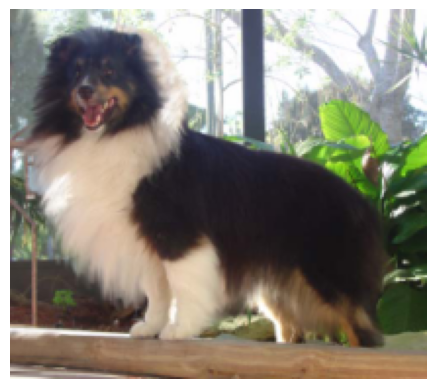

In [586]:
# 1 seule image. On pourrait la supprimer, mais on a déjà assez peu de data.
# En plus, regardez comme il est mignon !

addresses_alpha = color_df.loc[color_df['nb_canaux'] > 3, 'address_img'].values

with Image.open(addresses_alpha[0]) as img:
    plt.imshow(img)
    plt.axis('off')
    plt.show()


### new working folder


In [587]:
# Modifions notre fonction pour gérer directement la conversion.
# On pourrait aussi lui faire supprimer les éventuelles photos en noir et blanc, mais il n'y en a pas.
# Pour éviter de modifier la data d'origine, commençons à travailler ds un nveau dossier

def check_color(path=original_path):
    """ """
    data_path = glob(path + '*/*')
    list_folders = [folder for folder in data_path]
    dict_color = {'address_img': [], 'nb_canaux': []}  # Initialize the dictionary
    for folder in list_folders:
        path_pictures = glob(folder + '*/*.*')
        pics = [file for file in path_pictures]
        # create folder
        for pic in pics:
            # copy in new folder
            export_path = path_formatted
            # garder '-' pour regex
            output_path = os.path.join(export_path, '-'+address_into_breed(pic, lower=True))
            # print(output_path)
            img = cv2.imread(pic)
            os.makedirs(os.path.dirname(output_path), exist_ok=True)
            cv2.imwrite(output_path, img)
            # img.save(output_path) # use cv2 here, Image.save() doesn't automatically convert png into jpg

            with Image.open(output_path) as img:
                if 'A' in img.getbands():  # Check if image has alpha channel
                    img = img.convert('RGB')  # Convert image to RGB format to remove alpha channel
                    print('found one')
                color = len(img.getbands())
                dict_color['address_img'].append(output_path)  # Append image new address
                dict_color['nb_canaux'].append(color)  # Append number of channels

    return pd.DataFrame(dict_color)


color_df = check_color()
color_df.describe()

# min 3, max 3. ok


,nb_canaux
count,20580.0
mean,3.0
std,0.0
min,3.0
25%,3.0
50%,3.0
75%,3.0
max,3.0


### Compression


In [588]:
# juste par curiosité, le dataset étant très petit


def check_compression_rate(path=path_formatted):
    """ """
    data_path = glob(path + '*/*')
    list_folders = [folder for folder in data_path]
    dict_compress = {}  # Initialize the dictionary
    for folder in list_folders:
        path_pictures = glob(folder + '*/*.*')
        pics = [file for file in path_pictures]
        for pic in pics:
            with Image.open(pic) as img:
                # Get the compression rate (quality factor)
                quantization = img.quantization
                # Extract the compression rate from the quantization table
                compression_rate = quantization[0] if quantization else None
                dict_compress['pic'] = compression_rate

    return pd.DataFrame(dict_compress)


try:
    compress_df = check_compression_rate()
    display(compress_df.describe())
except Exception as e:
    print(f'new folder: {e}')

try:
    compress_df = check_compression_rate(path=original_path)
    compress_df.describe()
except Exception as e:
    print(f'original data: {e}')


# donc
# il y a en effet de grandes différences de compression entre les images (de 5 à 61)
# (techniquement, +tôt des "niveaux" de compression, ne correspond pas forcément à un pourcentage)

# Il y a bien une image au format PNG dans le dataset d'origine.
# Pourtant nous avions déjà vérifié ttes les extensions !


,pic
count,64.000000
mean,5.765625
std,3.462920
min,1.000000
25%,2.000000
50%,6.000000
75%,9.000000
max,12.000000


original data: 'PngImageFile' object has no attribute 'quantization'


### Format / extension mismatch


In [589]:
# ???

def check_format(path=original_path):
    dict_compress = {'format': []}  # Initialize the dictionary
    data_path = glob(os.path.join(path, '*/*.*'))

    for pic in data_path:
        with Image.open(pic) as img:
            # Get the image format
            image_format = img.format
            dict_compress['format'].append(image_format)

    return pd.DataFrame(dict_compress)


compress_df = check_format()
display(compress_df.describe())
compress_df['format'].unique()

# donc on a bien, ds le dataset d'origine, 1 ou +sieurs photos avec une extension .jpg,
# mais contenant en réalité des données au format (réel) png.

# Combien ?


,format
count,20580
unique,2
top,JPEG
freq,20579


array(['JPEG', 'PNG'], dtype=object)

In [590]:
def find_pngs(path=original_path):
    dict_pngs = {'address': []}  # Initialize the dictionary
    data_path = glob(os.path.join(path, '*/*.*'))

    for pic in data_path:
        with Image.open(pic) as img:
            # Get the image format
            image_format = img.format
            if img.format == 'PNG':
                dict_pngs['address'].append(pic) # on note l'adresse

    return pd.DataFrame(dict_pngs)


pngs_df = find_pngs()
display(pngs_df)
# 1 pic

address_png = pngs_df['address'][0]
print(address_png)
# Tiens, cette adresse me dit qqch...


,address
0,./data/raw_data/Images/n02105855-Shetland_shee...


./data/raw_data/Images/n02105855-Shetland_sheepdog/n02105855_2933.jpg


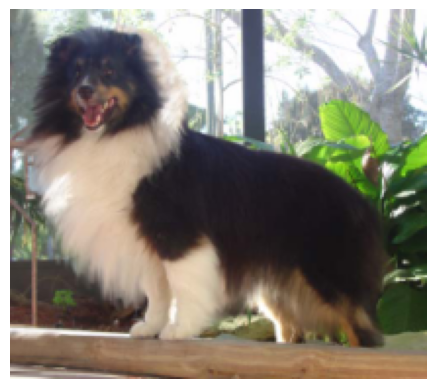

In [591]:
with Image.open(address_png) as img:
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# On t'a reconnu !
 # (encore lui)


In [592]:
# Le simple fait de copier nos images a réglé le problème, car
# cv2 reformate automatiquement en fonction de l'extention lors de la save
# (par défaut. On peut aussi passer le format souhaité en param)

compress_df = check_format(path=path_formatted)
display(compress_df.describe())
compress_df['format'].unique()


,format
count,20580
unique,1
top,JPEG
freq,20580


array(['JPEG'], dtype=object)

In [593]:
# du coup plus besoin de cette fonction

def convert_png_to_jpg(png_address, jpg_file):
    # Open the PNG image
    with Image.open(png_address) as img:
        # Convert and save as JPEG
        img.convert("RGB").save(jpg_file, "JPEG")


png_file = address_png
jpg_file = address_png # same
# convert_png_to_jpg(png_file, jpg_file)


### 1.7 Création du dataframe


In [594]:
# create df

data = pd.DataFrame()

for address in selected_breeds:
    print(address)
    path = f'{address}'
    data_path = glob(path+'*/*.*')

    breed = address_into_breed(address, lower=True) # + propre
    print(breed)

    folder_data = pd.DataFrame()
    list_original_addresses = [file for file in data_path]
    # je laisse un tiret pour pouvoir continuer à utiliser la mm regex
    list_new_addresses = [f'{path_formatted}/-{address_into_breed(file, lower=True)}'
                          for file in list_original_addresses]

    folder_data['photo_path'] = list_new_addresses
    folder_data['breed'] = breed
    data = pd.concat([data, folder_data], ignore_index=True)

# './data/raw_data/Images/n02085936-Maltese_dog'


./data/raw_data/Images/n02085936-Maltese_dog
maltese_dog
./data/raw_data/Images/n02088094-Afghan_hound
afghan_hound
./data/raw_data/Images/n02092002-Scottish_deerhound
scottish_deerhound


In [595]:
display(data.head())
data.tail()


,photo_path,breed
0,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog
1,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog
2,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog
3,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog
4,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog


,photo_path,breed
718,./data/cleaned_data/0_format/-scottish_deerhou...,scottish_deerhound
719,./data/cleaned_data/0_format/-scottish_deerhou...,scottish_deerhound
720,./data/cleaned_data/0_format/-scottish_deerhou...,scottish_deerhound
721,./data/cleaned_data/0_format/-scottish_deerhou...,scottish_deerhound
722,./data/cleaned_data/0_format/-scottish_deerhou...,scottish_deerhound


In [596]:
data.groupby("breed").count()


,photo_path
breed,
afghan_hound,239
maltese_dog,252
scottish_deerhound,232


### 1.8 Affichage de qq photos pour chaque classe


,photo_path,breed
0,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog


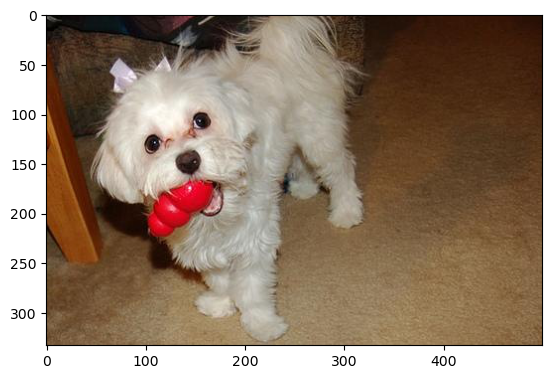

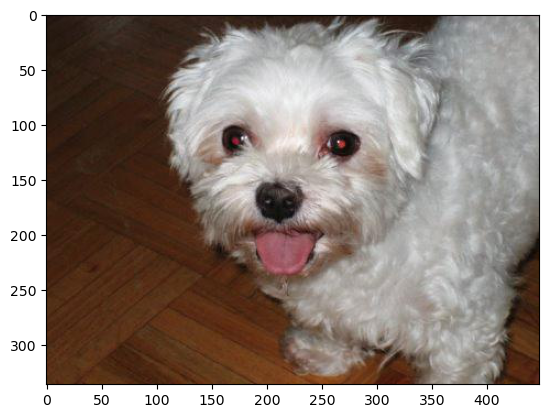

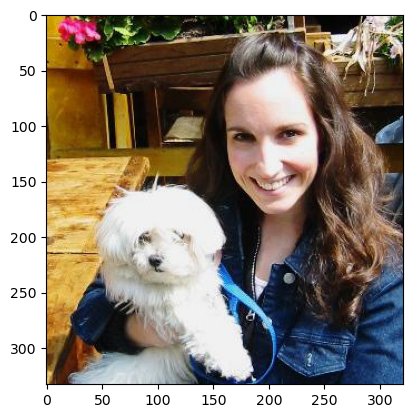

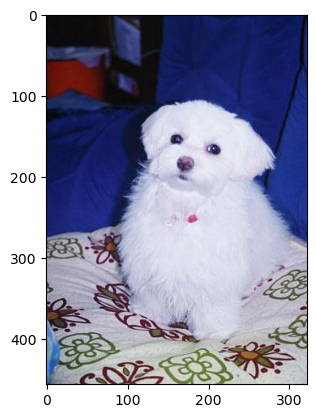

,photo_path,breed
0,./data/cleaned_data/0_format/-scottish_deerhou...,scottish_deerhound


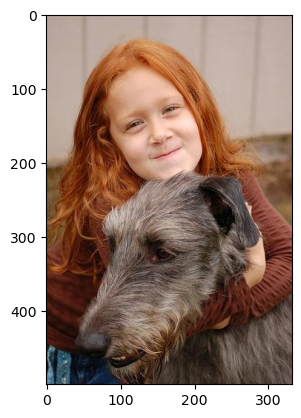

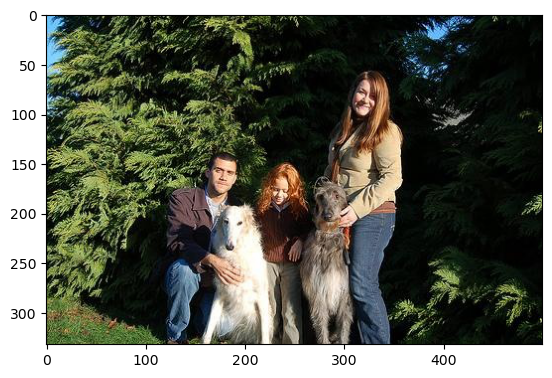

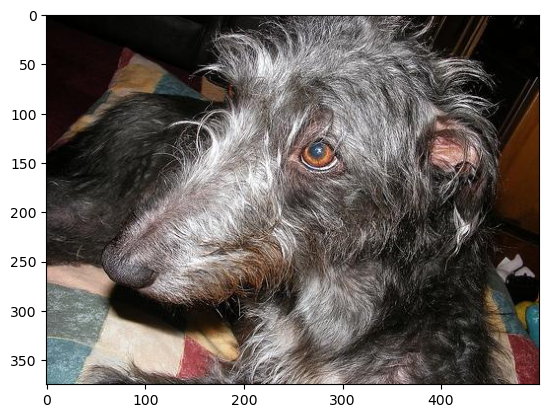

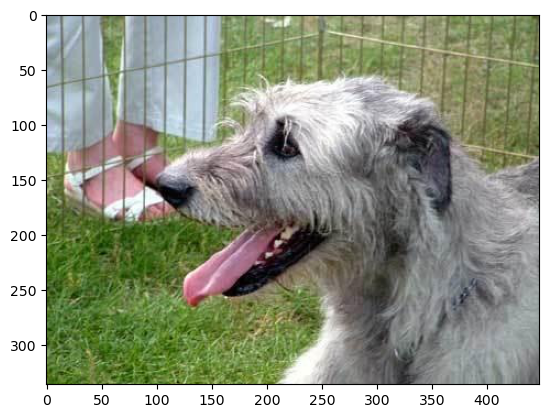

,photo_path,breed
0,./data/cleaned_data/0_format/-afghan_hound/n02...,afghan_hound


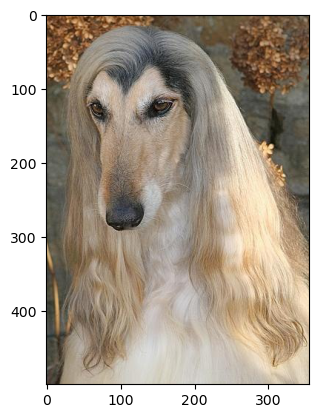

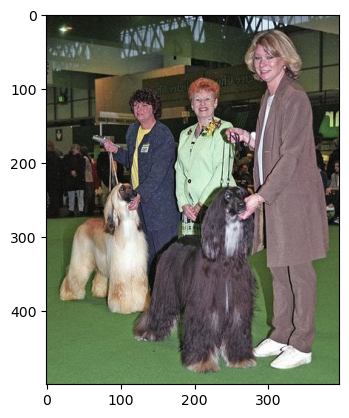

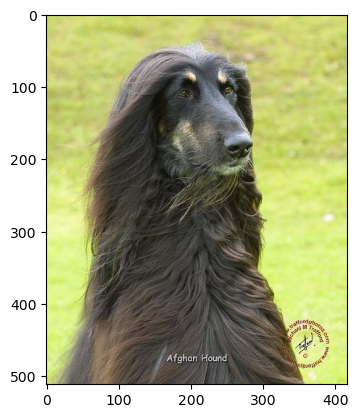

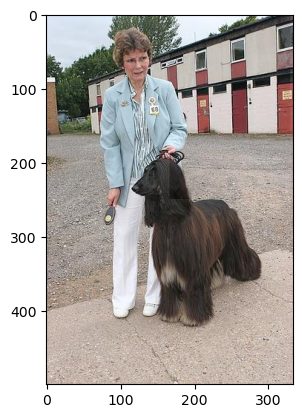

In [597]:
# show a few random pictures (4) for each breed

for breed in set(data['breed']):
    # Shuffle the subset
    shuffled_sample = data.loc[data['breed'] == breed, :].sample(n=4).reset_index(drop=True)
    display(shuffled_sample.head(1))

    for i in range(shuffled_sample.shape[0]):
        image = imread(shuffled_sample['photo_path'][i])
        plt.imshow(image)
        plt.show()

# tailles très diverses


### 1.9 Taille des images


In [598]:
# Ajouter infos pour .describe() : largeur, hauteur
# Ces métadonnées sont présentes dans le dossier Annotation, mais autant vérifier directement.

def get_width(address):
    """Return a picture's width (from its address)"""
    img = Image.open(address)
    width, height = img.size
    return width

def get_height(address):
    """Return a picture's height (from its address)"""
    img = Image.open(address)
    width, height = img.size
    return height

data['width'] = data['photo_path'].apply(get_width)
data['height'] = data['photo_path'].apply(get_height)

data.head()


,photo_path,breed,width,height
0,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,333
1,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,375
2,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,400,500
3,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,333
4,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,375


In [599]:
data[['width', 'height']].describe()


,width,height
count,723.000000,723.000000
mean,448.680498,415.004149
std,110.799319,95.457471
min,193.000000,180.000000
25%,375.000000,343.500000
50%,500.000000,375.000000
75%,500.000000,500.000000
max,1448.000000,1208.000000


In [600]:
# check pixel values ? (pour une éventuelle normalisation)
# 0-255 pour .jpg


## 2 Prétraitement


In [601]:
# Dépend du modèle


# Concerne seulement notre modèle perso (ntbk 2),
# les modèles importés pour le transfer learning (ntbk 3) ont leur propre preprocessing
# (fonction preprocess_input())

# models possible -> "inspiration" :
# vérifier licenses. Apache 2.0, GPL, MIT, CC... ?

# "historique" : AlexNet
# le + simple, five convolutional layers, followed by three fully connected layers

# vgg16 et 19
# restent assez simples (/nb de layers, mais entre guillemets car le cours précise qu'ils faut déjà
# + d'un mois pour les entrainer)

# GoogLeNet, also known as Inception v1 : 22 layers
# "introduced the Inception module, which allows the network to learn features at multiple scales.
# The Inception module consists of parallel convolutional layers with different filter sizes,
# which are concatenated to form the output of the module. GoogLeNet also introduced the use of
# global average pooling, which reduces the number of parameters in the network and helps
# prevent overfitting. " (https://jonascleveland.com/best-image-classification-models/)


# ensuite on passe à 55 couches (MobileNet), puis 81 (Xception) et + !
# (jusqu'à 533 pour NASNetLarge)

# Parmi ces modèles + profond : tester un ResNet (microsoft), DenseNet (facebook)

# OC : "tels que par exemple VGG16, ResNet50, Inception V3 ou Inception ResNetV2"


# envie de tester en + ds quelle mesure la couleur "aide" les modèles,
# en modifiant preprocessing(-> black & white) + 1ere layer ?
# puis comparer scores


### 2.1 Taille


In [602]:
# AlexNet : 227×227 pixels
# VGG16 : 256x256
# VGG19 : 224x224
# Nos + petites photos : largeur min 193, hauteur min 180

# Path to the directory containing the images
# in df
# image_dir = "./data/raw_images/"

# Path to save the resized images
output_dir = "./data/cleaned_data/1_resized_" + str(size_wh)
os.makedirs(output_dir, exist_ok=True)


def resize_pic(address, target_size=target_size):
    """Resize a picture, save the result, return result's path (input param : address)"""
    image = cv2.imread(address)

    # Resize the image
    resized_image = cv2.resize(image, target_size)

    # Save the resized image
    output_path = os.path.join(output_dir, '-'+address_into_breed(address))
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    cv2.imwrite(output_path, resized_image)

    return output_path


data['resized'] = data['photo_path'].apply(resize_pic)



In [603]:
data.head()


,photo_path,breed,width,height,resized
0,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,333,./data/cleaned_data/1_resized_128/-maltese_dog...
1,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,375,./data/cleaned_data/1_resized_128/-maltese_dog...
2,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,400,500,./data/cleaned_data/1_resized_128/-maltese_dog...
3,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,333,./data/cleaned_data/1_resized_128/-maltese_dog...
4,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,375,./data/cleaned_data/1_resized_128/-maltese_dog...


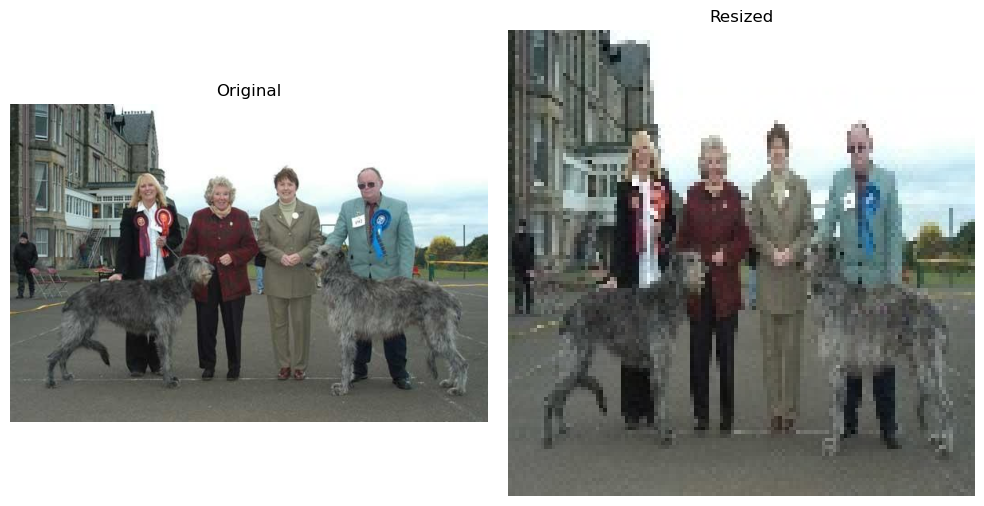

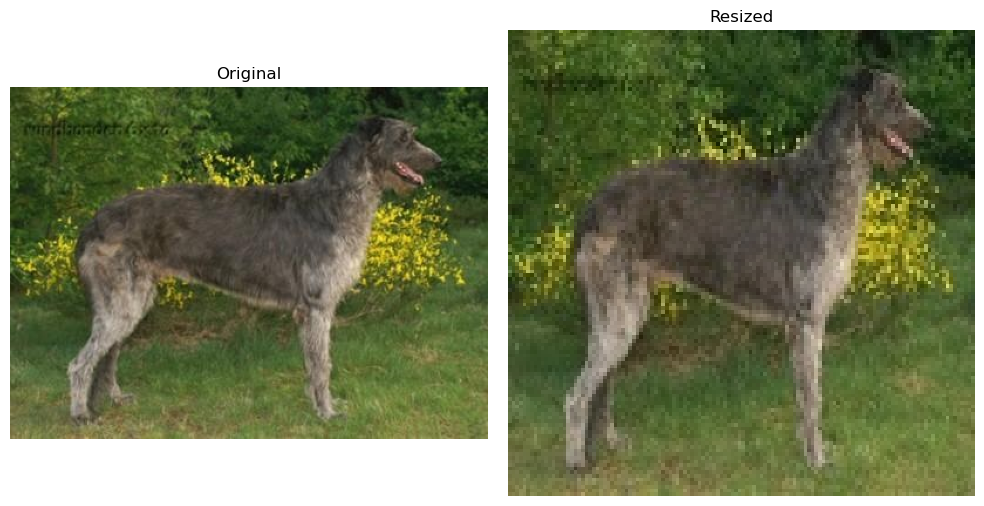

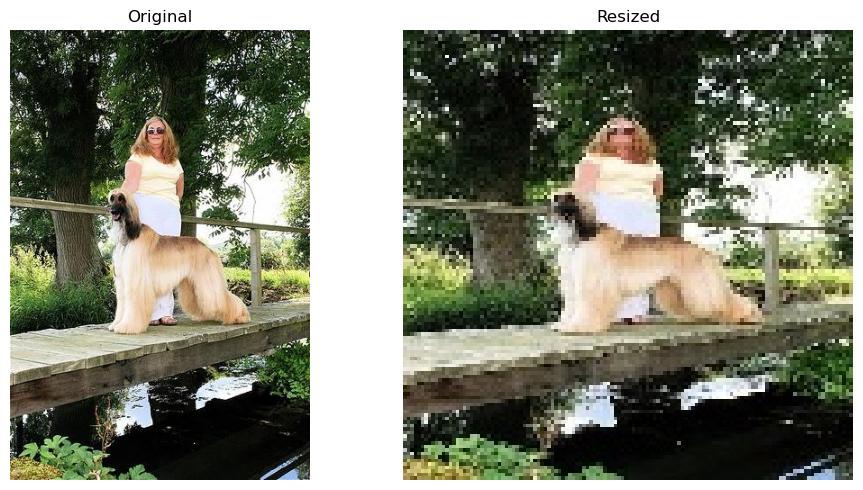

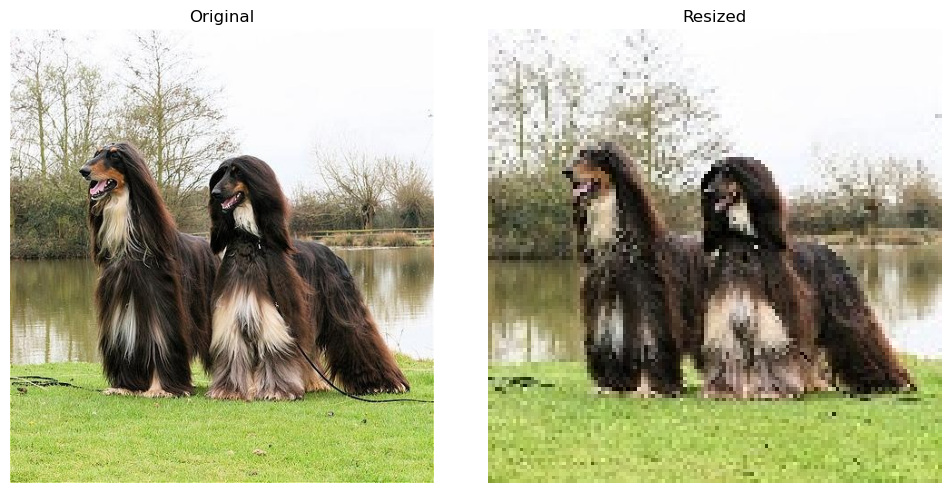

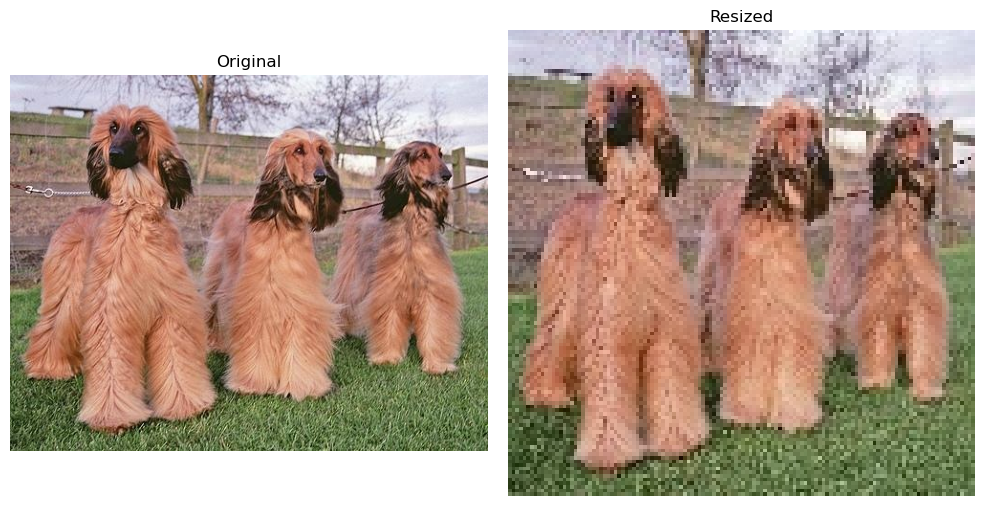

In [604]:
# Let's see the result

sample = data.sample(n=5).reset_index(drop=True)

for i in range(sample.shape[0]):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Load and display original image
    axes[0].imshow(cv2.cvtColor(cv2.imread(sample['photo_path'][i]), cv2.COLOR_BGR2RGB))
    axes[0].axis('off')
    axes[0].set_title('Original')

    # Load and display image with corrected exposition
    axes[1].imshow(cv2.cvtColor(cv2.imread(sample['resized'][i]), cv2.COLOR_BGR2RGB))
    axes[1].axis('off')
    axes[1].set_title('Resized')

    plt.tight_layout()
    plt.show()

# ok, le redimensionnement peut déformer les images, mais il n'y a pas de crop (perte d'info)


### 2.2 Exposition


In [605]:
# syntaxe pillow + simple que cv2

# Path to save the corrected images
output_dir = "./data/cleaned_data/2_expo_" + str(size_wh)
os.makedirs(output_dir, exist_ok=True)


def autocorrect_exposition(address):
    """On standardise l'exposition des photos, en utilisant la fonction .autoconstrast().
     Pour le contraste, il y a une fonction .autoexposition() ?? """
    # Read the image using PIL
    pil_img = Image.open(address)

    # Convert the image to RGB format (if it's not already)
    pil_img = pil_img.convert("RGB")

    # Apply autocontrast
    corrected_img = ImageOps.autocontrast(pil_img)

    # Save the corrected image
    output_path = os.path.join(output_dir, '-'+address_into_breed(address))
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    corrected_img.save(output_path)

    return output_path


data['expo'] = data['resized'].apply(autocorrect_exposition)


In [606]:
data.head()


,photo_path,breed,width,height,resized,expo
0,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,333,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...
1,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,375,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...
2,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,400,500,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...
3,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,333,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...
4,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,375,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...


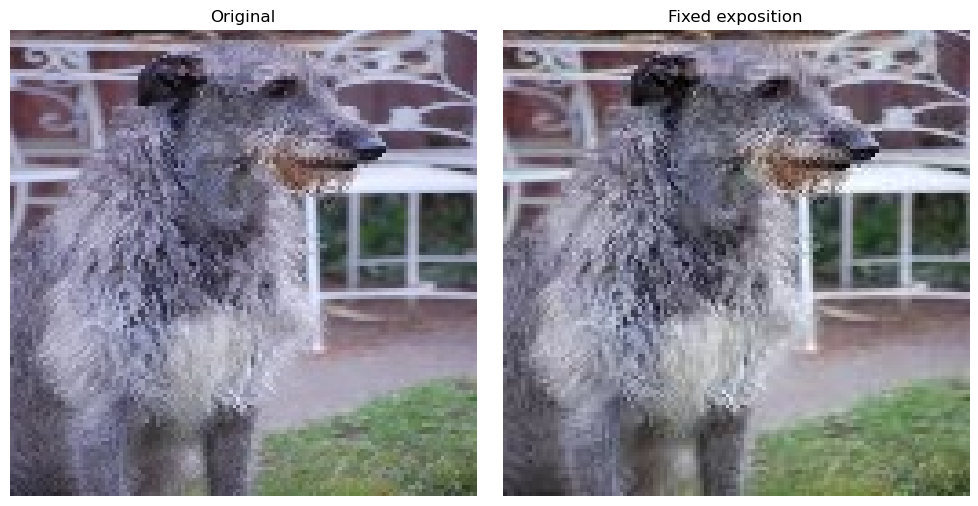

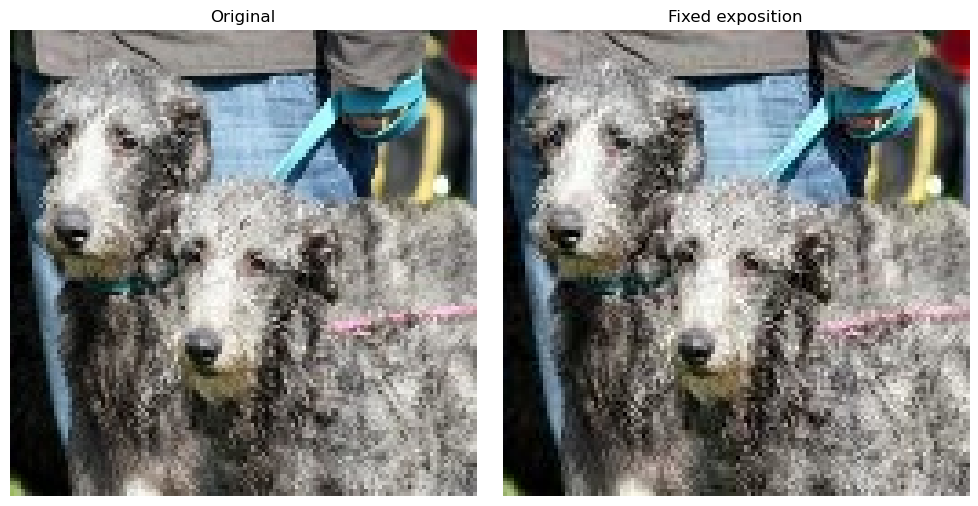

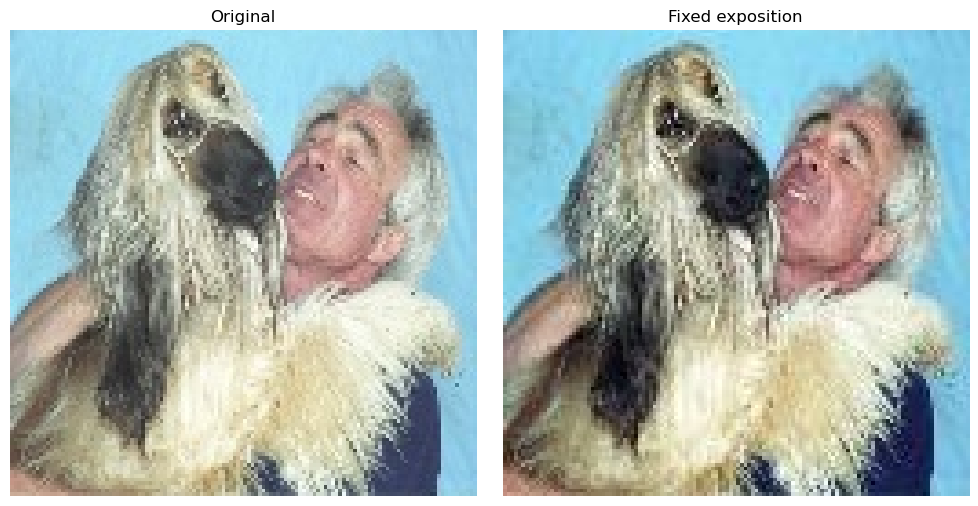

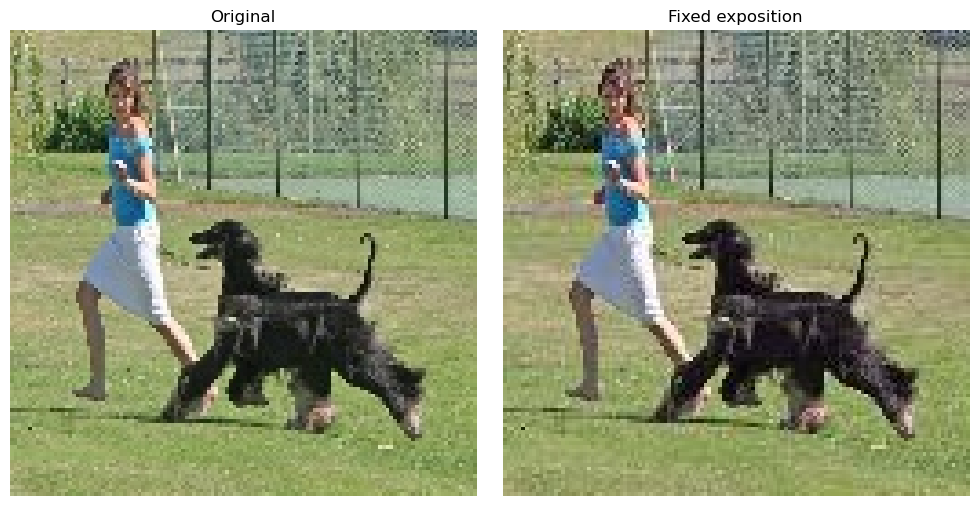

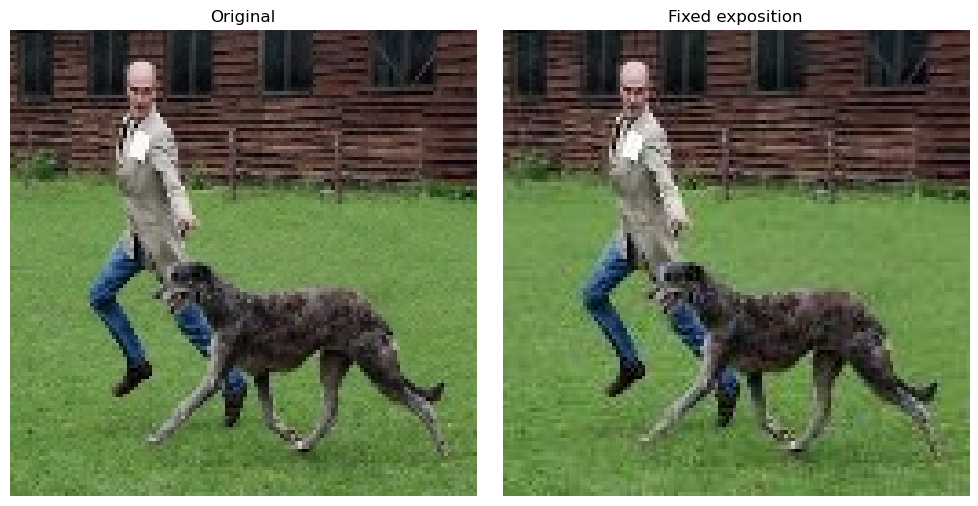

In [607]:
def before_after(before, after, title):
    """Pour visualiser facilement le résultats des opérations de prétraitement."""
    sample = data.sample(n=5).reset_index(drop=True)

    for i in range(sample.shape[0]):
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))

        # Load and display original image
        axes[0].imshow(cv2.cvtColor(cv2.imread(sample[before][i]), cv2.COLOR_BGR2RGB))
        axes[0].axis('off')
        axes[0].set_title('Original')

        # Load and display image with corrected exposition
        axes[1].imshow(cv2.cvtColor(cv2.imread(sample[after][i]), cv2.COLOR_BGR2RGB))
        axes[1].axis('off')
        axes[1].set_title(title)

        plt.tight_layout()
        plt.show()


before_after('resized', 'expo', 'Fixed exposition')

# L'effet est (parfois) moins évident, la plupart des photos ont déjà ss doute un système
# d'ajustement auto


### 2.3 Contraste


In [608]:
# Path to save the corrected images
output_dir = "./data/cleaned_data/3_contraste_" + str(size_wh)
os.makedirs(output_dir, exist_ok=True)


def autocorrect_contraste(address):
    """Standardise le contraste. Semble saturer / désaturer certaines couleurs ?"""
    # Read the image using PIL
    pil_img = Image.open(address)

    # Convert the image to RGB format (if it's not already) (it is)
    pil_img = pil_img.convert("RGB")

    # Apply autocontrast
    corrected_img = ImageOps.equalize(pil_img)

    # Save the corrected image
    output_path = os.path.join(output_dir, '-'+address_into_breed(address, 'expo'))
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    corrected_img.save(output_path)

    return output_path


data['contraste'] = data['expo'].apply(autocorrect_contraste)


In [609]:
data.head()


,photo_path,breed,width,height,resized,expo,contraste
0,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,333,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...,./data/cleaned_data/3_contraste_128/-maltese_d...
1,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,375,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...,./data/cleaned_data/3_contraste_128/-maltese_d...
2,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,400,500,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...,./data/cleaned_data/3_contraste_128/-maltese_d...
3,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,333,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...,./data/cleaned_data/3_contraste_128/-maltese_d...
4,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,375,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...,./data/cleaned_data/3_contraste_128/-maltese_d...


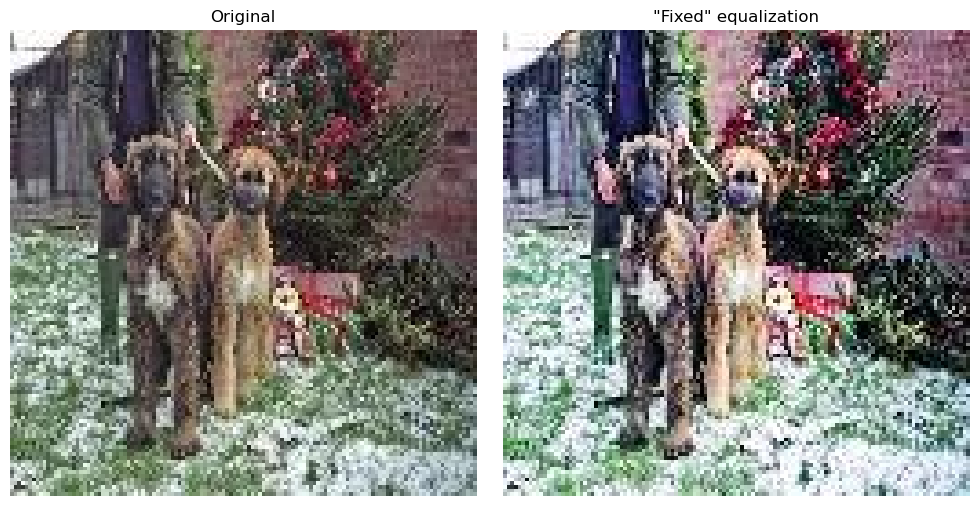

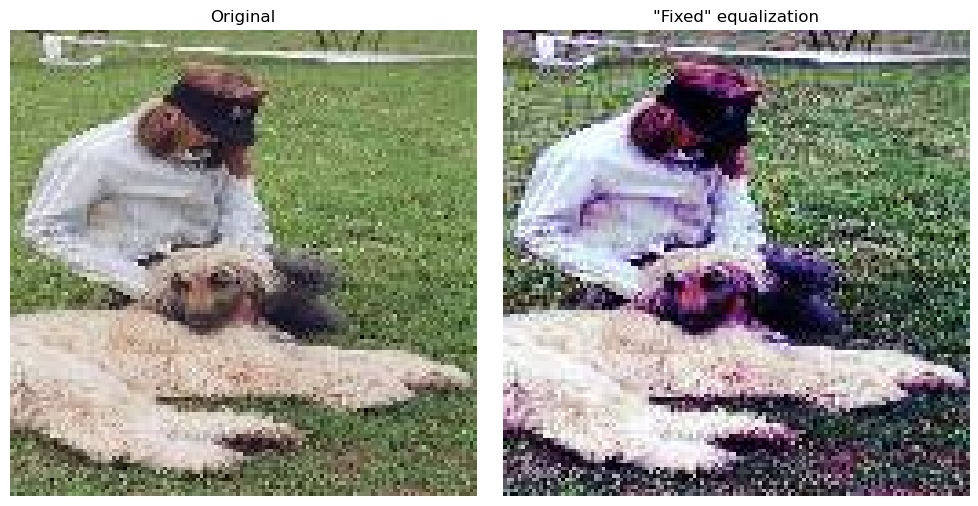

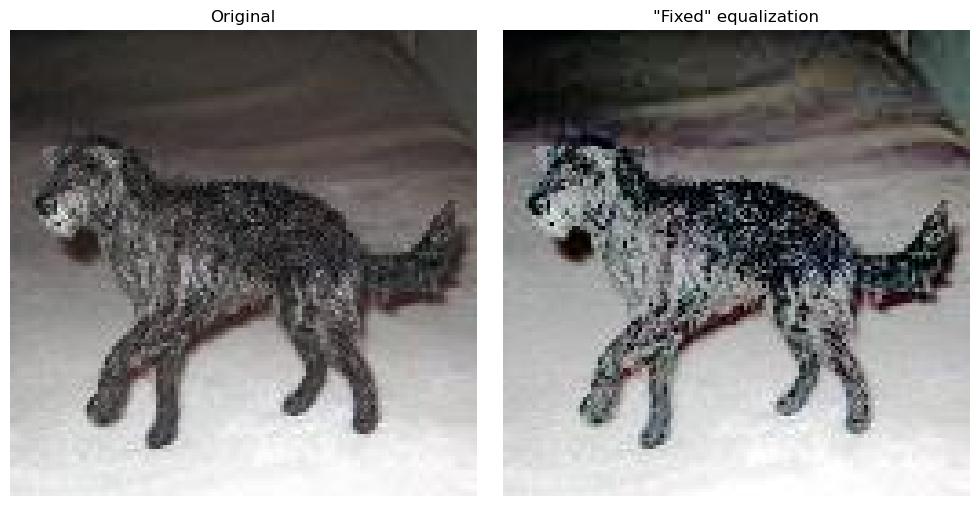

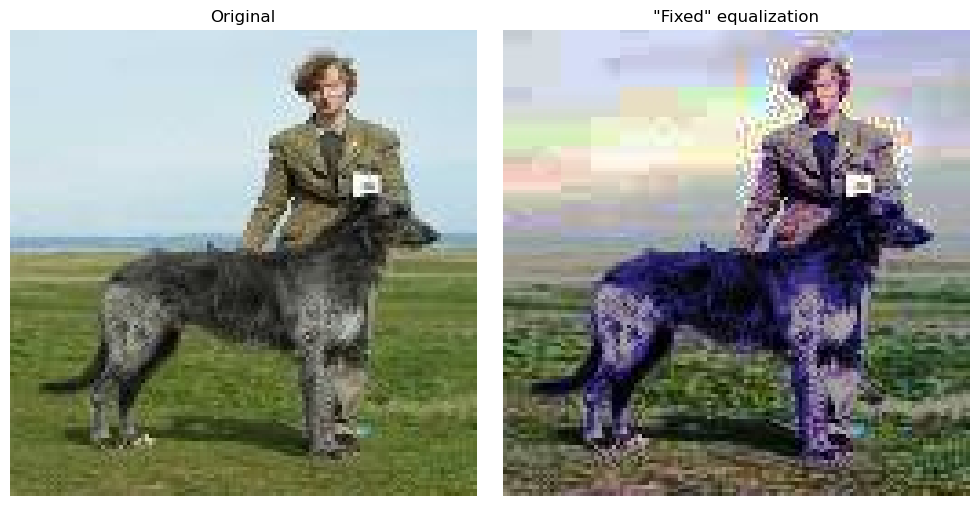

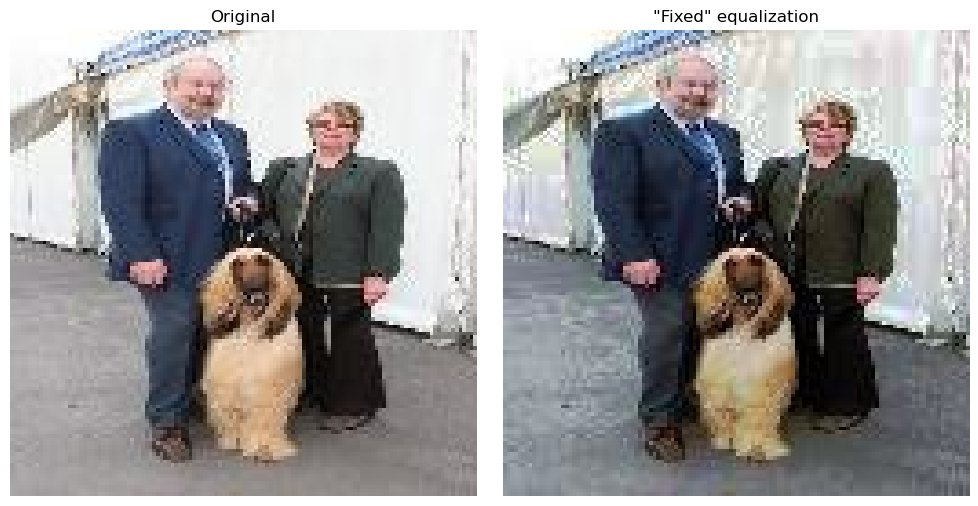

In [610]:
before_after('expo', 'contraste', '"Fixed" equalization')

# De mieux en mieux !


### 2.4 Bruit


In [611]:
# gaussien plutôt que médian, pas remarqué de bruit "poivre et sel"
# tester Bilatéral et Non-Local

# Path to save the corrected images
output_dir = "./data/cleaned_data/4_gauss_denoised_" + str(size_wh)
os.makedirs(output_dir, exist_ok=True)


def apply_gaussian_denoising(address, filter=5):
    """🎶 Complètement flou. Mais qu'est-ce qui nous arrive ? 🎶"""
    # Read the image using OpenCV
    img = cv2.imread(address)

    # Apply Gaussian denoising
    denoised_img = cv2.GaussianBlur(img, (filter, filter), 0)

    # Convert the denoised image to PIL format
    pil_img = Image.fromarray(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))

    # Save the denoised image
    output_path = os.path.join(output_dir, '-'+address_into_breed(address, 'contraste'))
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    pil_img.save(output_path)

    return output_path


data['denoised'] = data['contraste'].apply(apply_gaussian_denoising)


In [612]:
data.head()


,photo_path,breed,width,height,resized,expo,contraste,denoised
0,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,333,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...,./data/cleaned_data/3_contraste_128/-maltese_d...,./data/cleaned_data/4_gauss_denoised_128/-malt...
1,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,375,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...,./data/cleaned_data/3_contraste_128/-maltese_d...,./data/cleaned_data/4_gauss_denoised_128/-malt...
2,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,400,500,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...,./data/cleaned_data/3_contraste_128/-maltese_d...,./data/cleaned_data/4_gauss_denoised_128/-malt...
3,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,333,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...,./data/cleaned_data/3_contraste_128/-maltese_d...,./data/cleaned_data/4_gauss_denoised_128/-malt...
4,./data/cleaned_data/0_format/-maltese_dog/n020...,maltese_dog,500,375,./data/cleaned_data/1_resized_128/-maltese_dog...,./data/cleaned_data/2_expo_128/-maltese_dog/n0...,./data/cleaned_data/3_contraste_128/-maltese_d...,./data/cleaned_data/4_gauss_denoised_128/-malt...


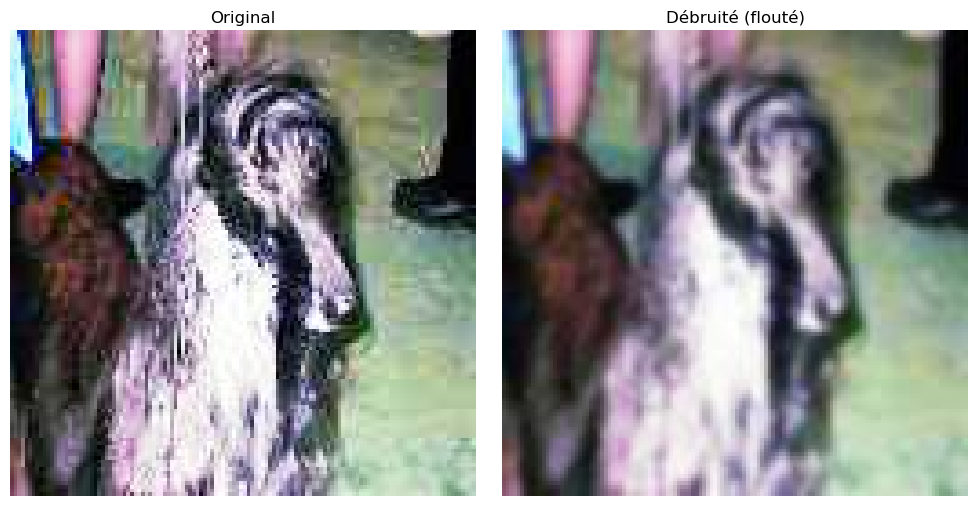

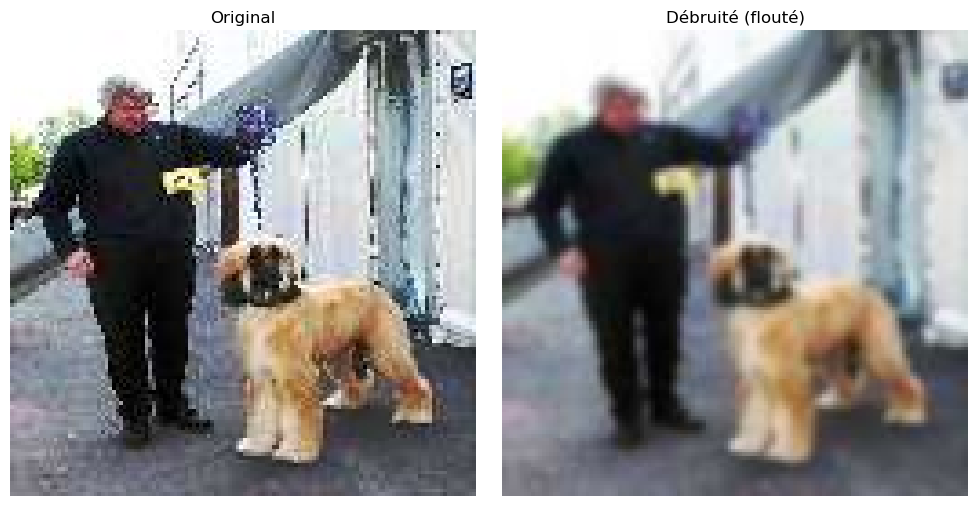

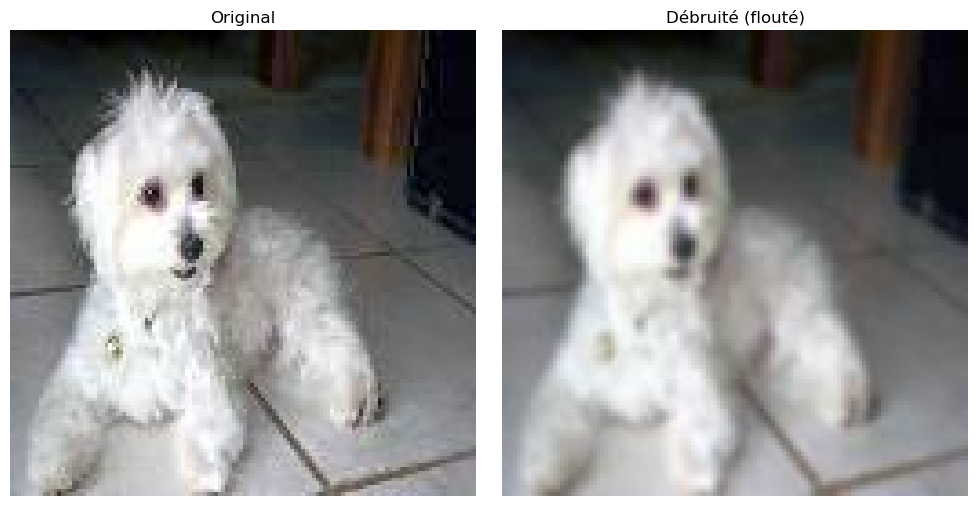

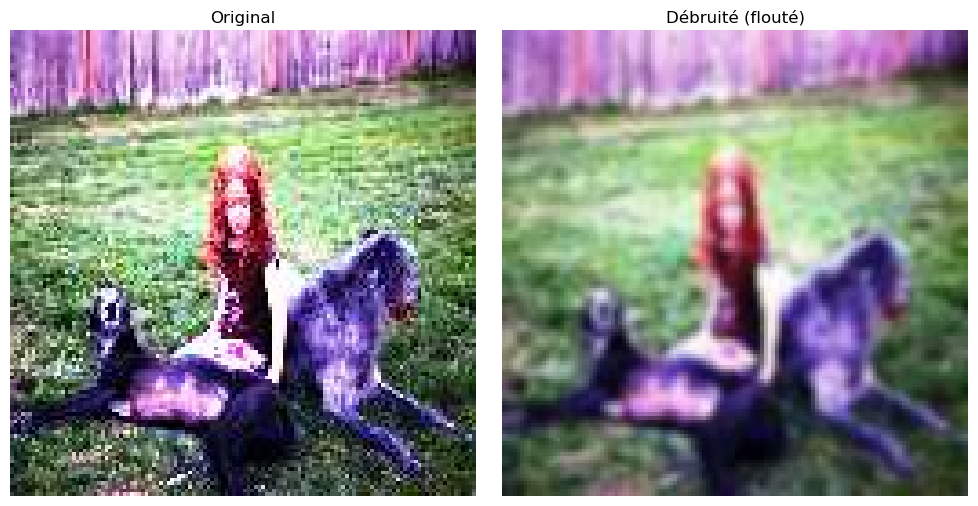

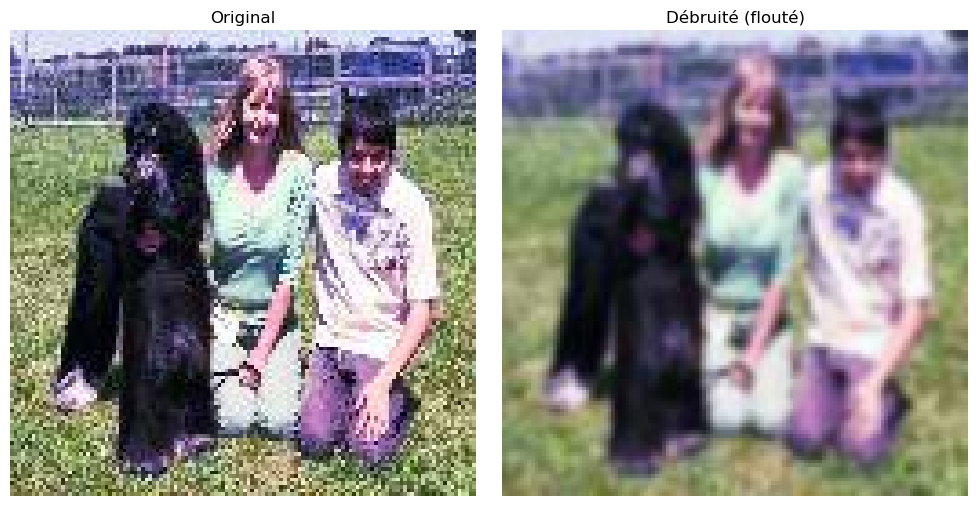

In [613]:
before_after('contraste', 'denoised', 'Débruité (flouté)')

# Plus de bruit, tt est calme.
# Trop ?


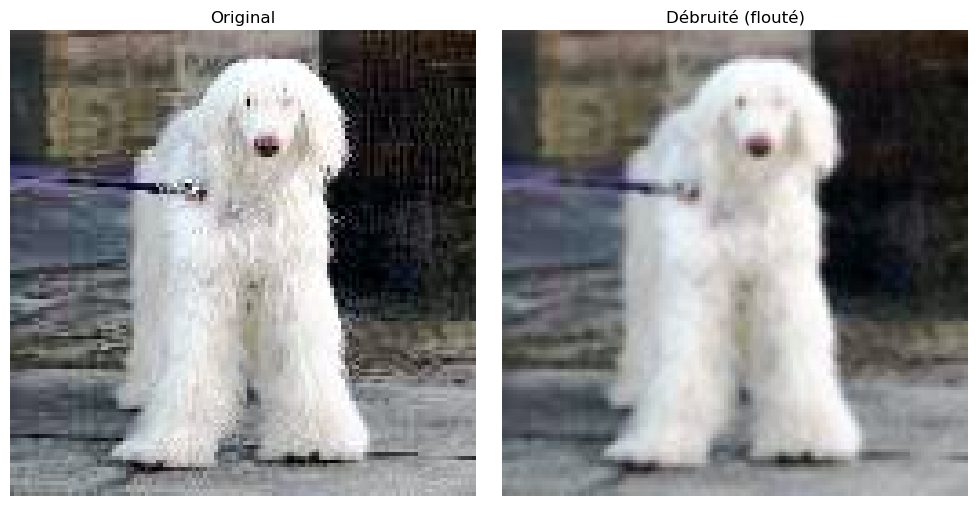

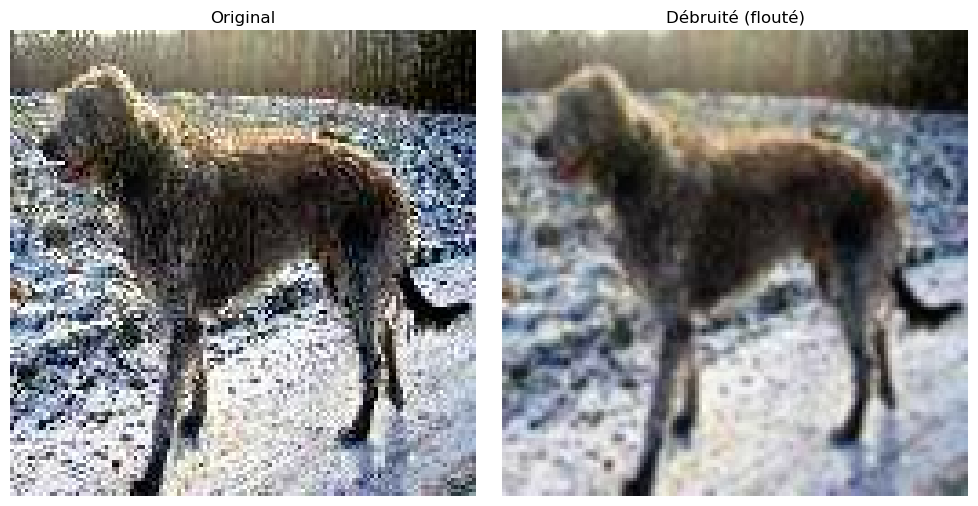

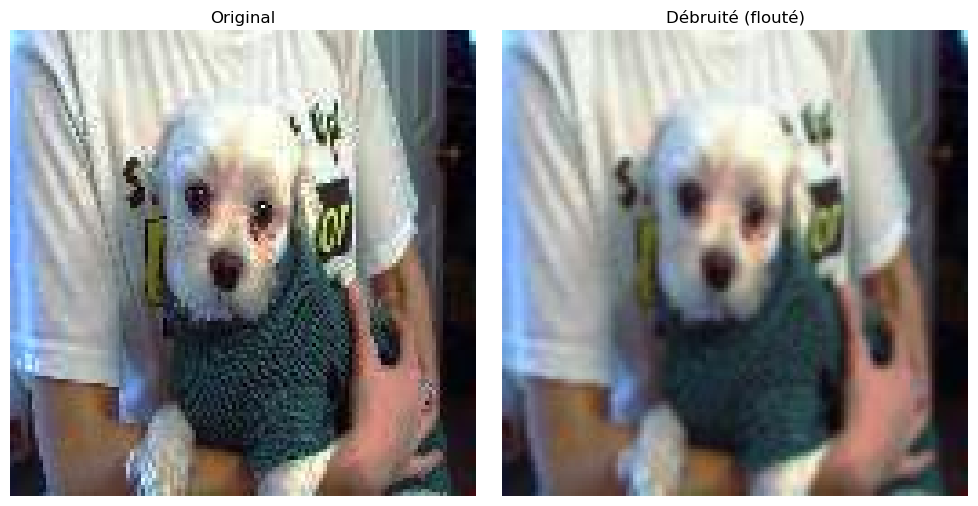

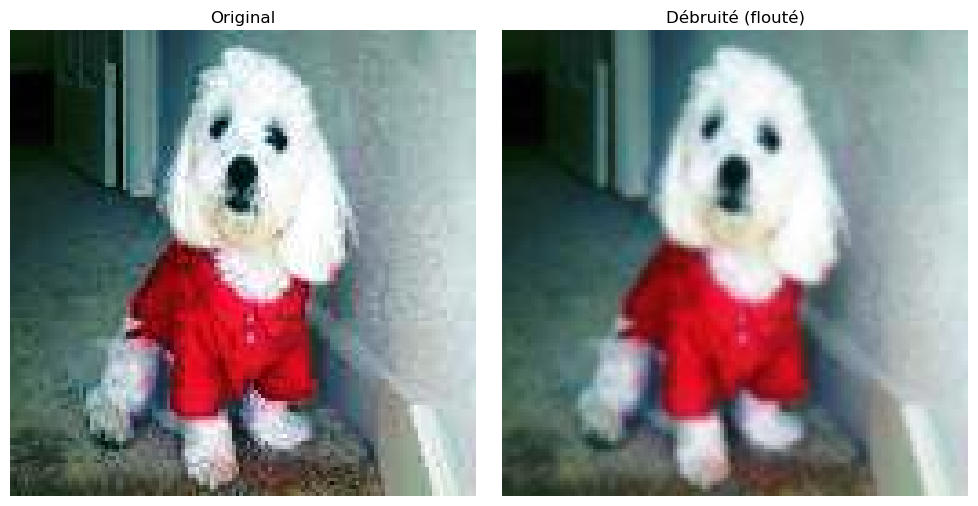

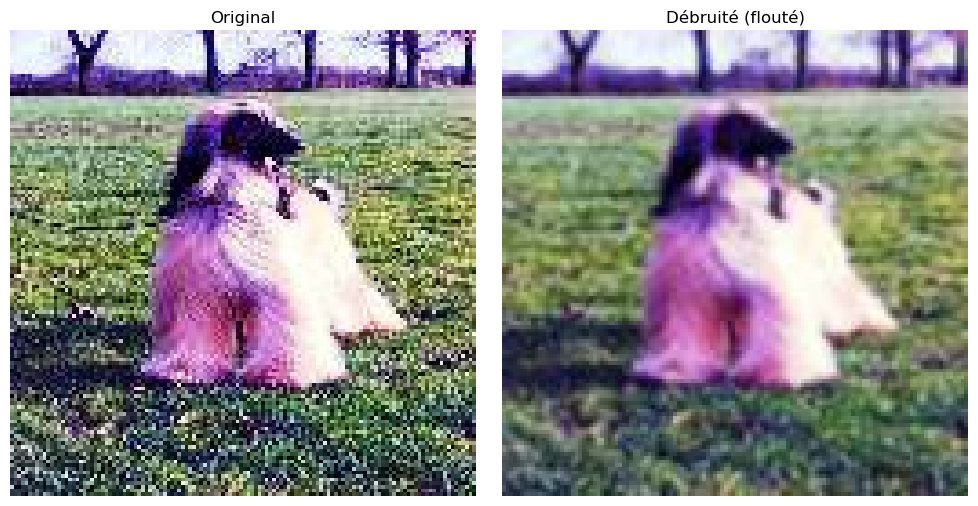

In [614]:
data['denoised'] = data['contraste'].apply(
    lambda x: apply_gaussian_denoising(x, filter=3))

before_after('contraste', 'denoised', 'Débruité (flouté)')

# + la taile de la grille augmente, plus on "floute" l'image.
# 3 semble être un bon compromis


In [615]:
# Bilateral


In [616]:
# Non-local


### (Normalisation)


In [617]:
# On a encore des traitements à faire pour la data augmentation,
# donc pour pouvoir observer on normalisera plutôt les valeurs des pixels
# juste avant de les donner en input au modèle.


## Export


In [618]:
data.to_csv('./data/data.csv', sep=',', index=False)
